In [1]:
import numpy as np
from pylab import *
import nibabel as nib

/Users/Devon/.venvs/nf/lib/python2.7/site-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [2]:
def find_contour(img, x, y, used_coords, loop_coords, val):
    for ix in range(x-1, x+2):
        for iy in range(y-1, y+2):
            if ix < 0 or iy < 0 or iy >= len(img) or ix >= len(img[0]):
                continue
            if img[iy][ix] != 0.0:
                if iy not in used_coords or ix not in used_coords[iy]:
                    loop_coords.append([ix,iy])
                    val = img[iy][ix]
                    #print "NESTED (%s, %s), LOOP: %s" % (ix, iy, loop_coords)
                    
                    # add coord to used_coords
                    if iy not in used_coords:
                        used_coords[iy] = {}
                    if ix not in used_coords[iy]:
                        used_coords[iy][ix] = True

                    used_coords, loop_coords, val = find_contour(img, ix, iy, used_coords, loop_coords, val)

    return used_coords, loop_coords, val

## Test find_contour logic on example grid

In [6]:
test = [[0,0,0,0,0],[0,0,1,0,0],[0,1,0,1,0],[0,0,1,0,0], [0,0,0,0,0]]

test_loop_coords = []
test_used_coords = {}
for y, rows in enumerate(test):
        for x, v in enumerate(rows):
            #print "START (%s, %s)" % (x,y)
            test_used_coords, test_loop_coords, test_loop_category = find_contour(test, x, y, test_used_coords, test_loop_coords, None)
print "FINAL", test_used_coords, test_loop_coords

FINAL {1: {2: True}, 2: {1: True, 3: True}, 3: {2: True}} [[2, 1], [1, 2], [2, 3], [3, 2]]


## Find contours on nii image

Load nii data from disk

In [11]:
nii_obj=nib.load('./segmentation-010.nii')
nii_data = nii_obj.get_fdata()

Convert nii matrix into per-dicom grid structure

In [12]:
img_data = [[[[None] for x in range(322)] for y in range(1086)] for z in range(20)]
for x, rows in enumerate(nii_data):
    for y, depths in enumerate(rows):
        for z, v in enumerate(depths):
            if v != 0.0:
                print z, y, x, v
            img_data[z][y][x] = v

10 212 60 4.0
10 213 60 4.0
11 213 60 4.0
10 214 60 4.0
11 214 60 4.0
10 215 60 4.0
11 215 60 4.0
10 216 60 4.0
11 216 60 4.0
11 217 60 4.0
10 210 61 4.0
10 211 61 4.0
10 212 61 4.0
11 212 61 4.0
10 213 61 4.0
11 213 61 4.0
10 214 61 4.0
11 214 61 4.0
10 215 61 4.0
11 215 61 4.0
10 216 61 4.0
11 216 61 4.0
10 217 61 4.0
11 217 61 4.0
11 218 61 4.0
10 207 62 4.0
10 208 62 4.0
11 208 62 4.0
10 209 62 4.0
11 209 62 4.0
10 210 62 4.0
11 210 62 4.0
10 211 62 4.0
11 211 62 4.0
10 212 62 4.0
11 212 62 4.0
10 213 62 4.0
11 213 62 4.0
10 214 62 4.0
11 214 62 4.0
10 215 62 4.0
11 215 62 4.0
10 216 62 4.0
11 216 62 4.0
10 217 62 4.0
11 217 62 4.0
10 218 62 4.0
11 218 62 4.0
10 205 63 4.0
11 205 63 4.0
10 206 63 4.0
11 206 63 4.0
9 207 63 4.0
10 207 63 4.0
11 207 63 4.0
10 208 63 4.0
11 208 63 4.0
10 209 63 4.0
11 209 63 4.0
10 210 63 4.0
11 210 63 4.0
10 211 63 4.0
11 211 63 4.0
10 212 63 4.0
11 212 63 4.0
10 213 63 4.0
11 213 63 4.0
10 214 63 4.0
11 214 63 4.0
10 215 63 4.0
11 215 63 4.0
10 216 

10 205 77 4.0
10 206 77 4.0
10 207 77 4.0
11 207 77 4.0
10 208 77 4.0
11 208 77 4.0
10 209 77 4.0
11 209 77 4.0
10 210 77 4.0
11 210 77 4.0
10 211 77 4.0
11 211 77 4.0
10 212 77 4.0
11 212 77 4.0
10 213 77 4.0
11 213 77 4.0
11 214 77 4.0
11 215 77 4.0
11 212 78 4.0
4 523 104 9.0
7 187 105 3.0
7 188 105 3.0
8 188 105 3.0
7 189 105 3.0
8 189 105 3.0
7 190 105 3.0
4 521 105 9.0
4 522 105 9.0
4 523 105 9.0
4 524 105 9.0
4 525 105 9.0
4 526 105 9.0
7 186 106 3.0
7 187 106 3.0
8 187 106 3.0
7 188 106 3.0
8 188 106 3.0
7 189 106 3.0
8 189 106 3.0
7 190 106 3.0
8 190 106 3.0
7 191 106 3.0
4 520 106 9.0
4 521 106 9.0
4 522 106 9.0
5 522 106 9.0
4 523 106 9.0
5 523 106 9.0
4 524 106 9.0
5 524 106 9.0
4 525 106 9.0
4 526 106 9.0
4 527 106 9.0
8 175 107 3.0
8 176 107 3.0
8 177 107 3.0
7 186 107 3.0
8 186 107 3.0
7 187 107 3.0
8 187 107 3.0
7 188 107 3.0
8 188 107 3.0
7 189 107 3.0
8 189 107 3.0
7 190 107 3.0
8 190 107 3.0
7 191 107 3.0
8 191 107 3.0
7 192 107 3.0
4 519 107 9.0
4 520 107 9.0
4 521 

9 177 120 3.0
7 178 120 3.0
8 178 120 3.0
9 178 120 3.0
7 179 120 3.0
8 179 120 3.0
9 179 120 3.0
7 180 120 3.0
8 180 120 3.0
9 180 120 3.0
7 181 120 3.0
8 181 120 3.0
9 181 120 3.0
7 182 120 3.0
8 182 120 3.0
9 182 120 3.0
7 183 120 3.0
8 183 120 3.0
9 183 120 3.0
7 184 120 3.0
8 184 120 3.0
7 185 120 3.0
8 185 120 3.0
7 186 120 3.0
8 186 120 3.0
6 187 120 3.0
7 187 120 3.0
8 187 120 3.0
6 188 120 3.0
7 188 120 3.0
8 188 120 3.0
7 189 120 3.0
8 189 120 3.0
7 190 120 3.0
8 190 120 3.0
7 191 120 3.0
8 191 120 3.0
7 192 120 3.0
7 193 120 3.0
8 165 121 3.0
9 165 121 3.0
8 166 121 3.0
9 166 121 3.0
8 167 121 3.0
9 167 121 3.0
8 168 121 3.0
9 168 121 3.0
8 169 121 3.0
9 169 121 3.0
7 170 121 3.0
8 170 121 3.0
9 170 121 3.0
7 171 121 3.0
8 171 121 3.0
9 171 121 3.0
7 172 121 3.0
8 172 121 3.0
9 172 121 3.0
7 173 121 3.0
8 173 121 3.0
9 173 121 3.0
10 173 121 3.0
7 174 121 3.0
8 174 121 3.0
9 174 121 3.0
10 174 121 3.0
7 175 121 3.0
8 175 121 3.0
9 175 121 3.0
7 176 121 3.0
8 176 121 3.0
9 17

9 167 129 3.0
9 168 129 3.0
9 169 129 3.0
8 170 129 3.0
9 170 129 3.0
8 171 129 3.0
9 171 129 3.0
8 172 129 3.0
9 172 129 3.0
8 173 129 3.0
9 173 129 3.0
8 174 129 3.0
9 174 129 3.0
8 175 129 3.0
9 175 129 3.0
8 176 129 3.0
9 176 129 3.0
7 182 129 3.0
8 182 129 3.0
7 183 129 3.0
8 183 129 3.0
7 184 129 3.0
7 185 129 3.0
7 186 129 3.0
7 187 129 3.0
7 188 129 3.0
7 189 129 3.0
7 190 129 3.0
9 263 129 5.0
9 264 129 5.0
9 265 129 5.0
9 266 129 5.0
8 267 129 5.0
9 267 129 5.0
10 267 129 5.0
8 268 129 5.0
9 268 129 5.0
10 268 129 5.0
11 268 129 5.0
12 268 129 5.0
8 269 129 5.0
9 269 129 5.0
10 269 129 5.0
11 269 129 5.0
12 269 129 5.0
13 269 129 5.0
8 270 129 5.0
9 270 129 5.0
10 270 129 5.0
11 270 129 5.0
12 270 129 5.0
13 270 129 5.0
9 271 129 5.0
10 271 129 5.0
11 271 129 5.0
12 271 129 5.0
13 271 129 5.0
9 272 129 5.0
10 272 129 5.0
11 272 129 5.0
12 272 129 5.0
13 272 129 5.0
9 273 129 5.0
10 273 129 5.0
11 273 129 5.0
12 273 129 5.0
13 273 129 5.0
9 274 129 5.0
10 274 129 5.0
11 274 12

14 269 133 5.0
8 270 133 5.0
9 270 133 5.0
10 270 133 5.0
11 270 133 5.0
12 270 133 5.0
13 270 133 5.0
14 270 133 5.0
8 271 133 5.0
9 271 133 5.0
10 271 133 5.0
11 271 133 5.0
12 271 133 5.0
13 271 133 5.0
8 272 133 5.0
9 272 133 5.0
10 272 133 5.0
11 272 133 5.0
12 272 133 5.0
13 272 133 5.0
8 273 133 5.0
9 273 133 5.0
10 273 133 5.0
11 273 133 5.0
12 273 133 5.0
13 273 133 5.0
9 274 133 5.0
10 274 133 5.0
11 274 133 5.0
12 274 133 5.0
13 274 133 5.0
9 275 133 5.0
10 275 133 5.0
11 275 133 5.0
12 275 133 5.0
13 275 133 5.0
9 276 133 5.0
10 276 133 5.0
11 276 133 5.0
12 276 133 5.0
13 276 133 5.0
9 277 133 5.0
10 277 133 5.0
11 277 133 5.0
12 277 133 5.0
13 277 133 5.0
14 277 133 5.0
9 278 133 5.0
10 278 133 5.0
11 278 133 5.0
12 278 133 5.0
13 278 133 5.0
14 278 133 5.0
10 279 133 5.0
11 279 133 5.0
12 279 133 5.0
13 279 133 5.0
14 279 133 5.0
10 280 133 5.0
11 280 133 5.0
12 280 133 5.0
13 280 133 5.0
14 280 133 5.0
10 281 133 5.0
11 281 133 5.0
12 281 133 5.0
13 281 133 5.0
10 282 1

11 462 136 7.0
10 463 136 7.0
11 463 136 7.0
10 464 136 7.0
10 465 136 7.0
7 175 137 2.0
7 176 137 2.0
7 177 137 2.0
7 178 137 2.0
7 179 137 2.0
8 179 137 2.0
7 180 137 2.0
8 180 137 2.0
7 181 137 2.0
8 181 137 2.0
7 182 137 2.0
8 182 137 2.0
7 183 137 2.0
8 183 137 2.0
7 184 137 2.0
8 184 137 2.0
7 185 137 2.0
8 185 137 2.0
7 186 137 2.0
8 186 137 2.0
7 187 137 2.0
8 187 137 2.0
7 188 137 2.0
8 188 137 2.0
7 189 137 2.0
7 190 137 2.0
7 191 137 2.0
12 259 137 5.0
11 260 137 5.0
12 260 137 5.0
13 260 137 5.0
11 261 137 5.0
12 261 137 5.0
13 261 137 5.0
10 262 137 5.0
11 262 137 5.0
12 262 137 5.0
13 262 137 5.0
14 262 137 5.0
9 263 137 5.0
10 263 137 5.0
11 263 137 5.0
12 263 137 5.0
13 263 137 5.0
14 263 137 5.0
8 264 137 5.0
9 264 137 5.0
10 264 137 5.0
11 264 137 5.0
12 264 137 5.0
13 264 137 5.0
14 264 137 5.0
8 265 137 5.0
9 265 137 5.0
10 265 137 5.0
11 265 137 5.0
12 265 137 5.0
13 265 137 5.0
14 265 137 5.0
8 266 137 5.0
9 266 137 5.0
10 266 137 5.0
11 266 137 5.0
12 266 137 5.0

11 446 139 7.0
12 446 139 7.0
13 446 139 7.0
11 447 139 7.0
12 447 139 7.0
13 447 139 7.0
11 448 139 7.0
12 448 139 7.0
13 448 139 7.0
11 449 139 7.0
12 449 139 7.0
13 449 139 7.0
11 450 139 7.0
12 450 139 7.0
13 450 139 7.0
10 451 139 7.0
11 451 139 7.0
12 451 139 7.0
10 452 139 7.0
11 452 139 7.0
12 452 139 7.0
10 453 139 7.0
11 453 139 7.0
12 453 139 7.0
10 454 139 7.0
11 454 139 7.0
10 455 139 7.0
11 455 139 7.0
10 456 139 7.0
11 456 139 7.0
10 457 139 7.0
11 457 139 7.0
10 458 139 7.0
11 458 139 7.0
10 459 139 7.0
11 459 139 7.0
10 460 139 7.0
11 460 139 7.0
10 461 139 7.0
11 461 139 7.0
10 462 139 7.0
10 463 139 7.0
7 175 140 2.0
7 176 140 2.0
7 177 140 2.0
7 178 140 2.0
8 178 140 2.0
7 179 140 2.0
8 179 140 2.0
7 180 140 2.0
8 180 140 2.0
7 181 140 2.0
8 181 140 2.0
7 182 140 2.0
8 182 140 2.0
7 183 140 2.0
8 183 140 2.0
9 183 140 2.0
7 184 140 2.0
8 184 140 2.0
9 184 140 2.0
7 185 140 2.0
8 185 140 2.0
9 185 140 2.0
7 186 140 2.0
8 186 140 2.0
9 186 140 2.0
7 187 140 2.0
8 187 

12 261 142 5.0
13 261 142 5.0
14 261 142 5.0
10 262 142 5.0
11 262 142 5.0
12 262 142 5.0
13 262 142 5.0
14 262 142 5.0
10 263 142 5.0
11 263 142 5.0
12 263 142 5.0
13 263 142 5.0
14 263 142 5.0
9 264 142 5.0
10 264 142 5.0
11 264 142 5.0
12 264 142 5.0
13 264 142 5.0
14 264 142 5.0
9 265 142 5.0
10 265 142 5.0
11 265 142 5.0
12 265 142 5.0
13 265 142 5.0
14 265 142 5.0
9 266 142 5.0
10 266 142 5.0
11 266 142 5.0
12 266 142 5.0
13 266 142 5.0
14 266 142 5.0
15 266 142 5.0
9 267 142 5.0
10 267 142 5.0
11 267 142 5.0
12 267 142 5.0
13 267 142 5.0
14 267 142 5.0
15 267 142 5.0
9 268 142 5.0
10 268 142 5.0
11 268 142 5.0
12 268 142 5.0
13 268 142 5.0
14 268 142 5.0
15 268 142 5.0
9 269 142 5.0
10 269 142 5.0
11 269 142 5.0
12 269 142 5.0
13 269 142 5.0
14 269 142 5.0
15 269 142 5.0
9 270 142 5.0
10 270 142 5.0
11 270 142 5.0
12 270 142 5.0
13 270 142 5.0
14 270 142 5.0
15 270 142 5.0
9 271 142 5.0
10 271 142 5.0
11 271 142 5.0
12 271 142 5.0
13 271 142 5.0
14 271 142 5.0
15 271 142 5.0
9 2

11 448 144 7.0
12 448 144 7.0
13 448 144 7.0
11 449 144 7.0
12 449 144 7.0
13 449 144 7.0
11 450 144 7.0
12 450 144 7.0
12 451 144 7.0
12 452 144 7.0
13 454 144 7.0
13 455 144 7.0
7 177 145 2.0
7 178 145 2.0
8 178 145 2.0
7 179 145 2.0
8 179 145 2.0
7 180 145 2.0
8 180 145 2.0
7 181 145 2.0
8 181 145 2.0
7 182 145 2.0
8 182 145 2.0
9 182 145 2.0
6 183 145 2.0
7 183 145 2.0
8 183 145 2.0
9 183 145 2.0
6 184 145 2.0
7 184 145 2.0
8 184 145 2.0
9 184 145 2.0
6 185 145 2.0
7 185 145 2.0
8 185 145 2.0
9 185 145 2.0
6 186 145 2.0
7 186 145 2.0
8 186 145 2.0
9 186 145 2.0
6 187 145 2.0
7 187 145 2.0
8 187 145 2.0
9 187 145 2.0
6 188 145 2.0
7 188 145 2.0
8 188 145 2.0
9 188 145 2.0
7 189 145 2.0
8 189 145 2.0
9 189 145 2.0
7 190 145 2.0
8 190 145 2.0
9 190 145 2.0
7 191 145 2.0
8 191 145 2.0
9 191 145 2.0
7 192 145 2.0
8 192 145 2.0
9 192 145 2.0
7 193 145 2.0
8 193 145 2.0
9 193 145 2.0
7 194 145 2.0
8 194 145 2.0
9 194 145 2.0
7 195 145 2.0
8 195 145 2.0
9 195 145 2.0
7 196 145 2.0
8 196 14

14 282 147 5.0
9 283 147 5.0
10 283 147 5.0
11 283 147 5.0
12 283 147 5.0
13 283 147 5.0
14 283 147 5.0
9 284 147 5.0
10 284 147 5.0
11 284 147 5.0
12 284 147 5.0
13 284 147 5.0
14 284 147 5.0
9 285 147 5.0
10 285 147 5.0
11 285 147 5.0
12 285 147 5.0
13 285 147 5.0
14 285 147 5.0
9 286 147 5.0
10 286 147 5.0
11 286 147 5.0
12 286 147 5.0
13 286 147 5.0
14 286 147 5.0
9 287 147 5.0
10 287 147 5.0
11 287 147 5.0
12 287 147 5.0
13 287 147 5.0
9 288 147 5.0
10 288 147 5.0
11 288 147 5.0
12 288 147 5.0
13 288 147 5.0
8 289 147 5.0
9 289 147 5.0
10 289 147 5.0
11 289 147 5.0
12 289 147 5.0
13 289 147 5.0
9 290 147 5.0
10 290 147 5.0
11 290 147 5.0
12 290 147 5.0
13 290 147 5.0
9 291 147 5.0
10 291 147 5.0
11 291 147 5.0
12 291 147 5.0
13 291 147 5.0
9 292 147 5.0
10 292 147 5.0
11 292 147 5.0
12 292 147 5.0
9 293 147 5.0
10 293 147 5.0
11 293 147 5.0
12 293 147 5.0
10 294 147 5.0
11 294 147 5.0
12 294 147 5.0
10 295 147 5.0
11 295 147 5.0
12 295 147 5.0
11 296 147 5.0
11 297 147 5.0
12 436 

14 453 149 7.0
12 454 149 7.0
13 454 149 7.0
14 454 149 7.0
12 455 149 7.0
13 455 149 7.0
14 455 149 7.0
12 456 149 7.0
13 456 149 7.0
14 456 149 7.0
13 457 149 7.0
14 457 149 7.0
13 458 149 7.0
14 458 149 7.0
13 459 149 7.0
14 459 149 7.0
13 460 149 7.0
14 460 149 7.0
13 461 149 7.0
7 179 150 2.0
8 179 150 2.0
7 180 150 2.0
8 180 150 2.0
7 181 150 2.0
8 181 150 2.0
7 182 150 2.0
8 182 150 2.0
7 183 150 2.0
8 183 150 2.0
7 184 150 2.0
8 184 150 2.0
7 185 150 2.0
8 185 150 2.0
9 185 150 2.0
7 186 150 2.0
8 186 150 2.0
9 186 150 2.0
7 187 150 2.0
8 187 150 2.0
9 187 150 2.0
7 188 150 2.0
8 188 150 2.0
9 188 150 2.0
7 189 150 2.0
8 189 150 2.0
9 189 150 2.0
7 190 150 2.0
8 190 150 2.0
9 190 150 2.0
7 191 150 2.0
8 191 150 2.0
9 191 150 2.0
7 192 150 2.0
8 192 150 2.0
9 192 150 2.0
7 193 150 2.0
8 193 150 2.0
9 193 150 2.0
7 194 150 2.0
8 194 150 2.0
9 194 150 2.0
7 195 150 2.0
8 195 150 2.0
9 195 150 2.0
7 196 150 2.0
8 196 150 2.0
9 196 150 2.0
7 197 150 2.0
8 197 150 2.0
9 197 150 2.0
7

12 433 152 7.0
12 434 152 7.0
12 435 152 7.0
12 436 152 7.0
11 437 152 7.0
12 437 152 7.0
10 438 152 7.0
11 438 152 7.0
12 438 152 7.0
13 438 152 7.0
10 439 152 7.0
11 439 152 7.0
12 439 152 7.0
13 439 152 7.0
10 440 152 7.0
11 440 152 7.0
12 440 152 7.0
13 440 152 7.0
10 441 152 7.0
11 441 152 7.0
12 441 152 7.0
13 441 152 7.0
14 441 152 7.0
10 442 152 7.0
11 442 152 7.0
12 442 152 7.0
13 442 152 7.0
14 442 152 7.0
10 443 152 7.0
11 443 152 7.0
12 443 152 7.0
13 443 152 7.0
14 443 152 7.0
10 444 152 7.0
11 444 152 7.0
12 444 152 7.0
13 444 152 7.0
14 444 152 7.0
10 445 152 7.0
11 445 152 7.0
12 445 152 7.0
13 445 152 7.0
14 445 152 7.0
11 446 152 7.0
12 446 152 7.0
13 446 152 7.0
14 446 152 7.0
11 447 152 7.0
12 447 152 7.0
13 447 152 7.0
14 447 152 7.0
11 448 152 7.0
12 448 152 7.0
13 448 152 7.0
14 448 152 7.0
12 449 152 7.0
13 449 152 7.0
14 449 152 7.0
13 450 152 7.0
14 450 152 7.0
13 451 152 7.0
14 451 152 7.0
13 452 152 7.0
14 452 152 7.0
13 453 152 7.0
14 453 152 7.0
13 454 152

10 289 156 5.0
11 289 156 5.0
12 289 156 5.0
9 290 156 5.0
10 290 156 5.0
11 290 156 5.0
12 290 156 5.0
9 291 156 5.0
10 291 156 5.0
11 291 156 5.0
12 291 156 5.0
10 292 156 5.0
11 292 156 5.0
12 292 156 5.0
10 293 156 5.0
11 293 156 5.0
10 294 156 5.0
11 294 156 5.0
10 295 156 5.0
11 295 156 5.0
11 296 156 5.0
12 436 156 7.0
12 437 156 7.0
11 438 156 7.0
12 438 156 7.0
11 439 156 7.0
12 439 156 7.0
10 440 156 7.0
11 440 156 7.0
12 440 156 7.0
10 441 156 7.0
11 441 156 7.0
12 441 156 7.0
11 442 156 7.0
12 442 156 7.0
11 443 156 7.0
12 443 156 7.0
13 443 156 7.0
11 444 156 7.0
12 444 156 7.0
13 444 156 7.0
11 445 156 7.0
12 445 156 7.0
13 445 156 7.0
11 446 156 7.0
12 446 156 7.0
13 446 156 7.0
12 447 156 7.0
13 447 156 7.0
12 448 156 7.0
13 448 156 7.0
12 449 156 7.0
13 449 156 7.0
13 450 156 7.0
13 451 156 7.0
13 452 156 7.0
13 453 156 7.0
13 454 156 7.0
13 456 156 7.0
11 262 157 5.0
11 263 157 5.0
10 264 157 5.0
11 264 157 5.0
10 265 157 5.0
11 265 157 5.0
12 265 157 5.0
10 266 157 5

11 269 162 5.0
10 270 162 5.0
11 270 162 5.0
10 271 162 5.0
11 271 162 5.0
12 271 162 5.0
10 272 162 5.0
11 272 162 5.0
12 272 162 5.0
10 273 162 5.0
11 273 162 5.0
12 273 162 5.0
10 274 162 5.0
11 274 162 5.0
12 274 162 5.0
10 275 162 5.0
11 275 162 5.0
12 275 162 5.0
10 276 162 5.0
11 276 162 5.0
12 276 162 5.0
9 277 162 5.0
10 277 162 5.0
11 277 162 5.0
12 277 162 5.0
9 278 162 5.0
10 278 162 5.0
11 278 162 5.0
12 278 162 5.0
9 279 162 5.0
10 279 162 5.0
11 279 162 5.0
12 279 162 5.0
9 280 162 5.0
10 280 162 5.0
11 280 162 5.0
12 280 162 5.0
9 281 162 5.0
10 281 162 5.0
11 281 162 5.0
12 281 162 5.0
9 282 162 5.0
10 282 162 5.0
11 282 162 5.0
12 282 162 5.0
9 283 162 5.0
10 283 162 5.0
11 283 162 5.0
12 283 162 5.0
9 284 162 5.0
10 284 162 5.0
11 284 162 5.0
12 284 162 5.0
9 285 162 5.0
10 285 162 5.0
11 285 162 5.0
12 285 162 5.0
10 286 162 5.0
11 286 162 5.0
12 286 162 5.0
10 287 162 5.0
11 287 162 5.0
12 287 162 5.0
10 288 162 5.0
11 288 162 5.0
12 288 162 5.0
10 289 162 5.0
11 2

10 363 177 6.0
15 496 177 1.0
17 496 177 1.0
15 497 177 1.0
17 497 177 1.0
13 498 177 8.0
14 498 177 8.0
15 498 177 1.0
16 498 177 1.0
17 498 177 1.0
18 498 177 1.0
13 499 177 8.0
14 499 177 8.0
15 499 177 8.0
16 499 177 1.0
17 499 177 1.0
18 499 177 1.0
13 500 177 8.0
14 500 177 8.0
15 500 177 8.0
16 500 177 1.0
17 500 177 8.0
18 500 177 1.0
13 501 177 8.0
14 501 177 8.0
15 501 177 8.0
16 501 177 1.0
17 501 177 8.0
18 501 177 1.0
13 502 177 8.0
14 502 177 8.0
15 502 177 8.0
16 502 177 1.0
17 502 177 8.0
18 502 177 1.0
13 503 177 8.0
14 503 177 8.0
15 503 177 8.0
16 503 177 1.0
17 503 177 8.0
18 503 177 1.0
13 504 177 8.0
14 504 177 8.0
15 504 177 8.0
16 504 177 8.0
17 504 177 8.0
18 504 177 1.0
14 505 177 8.0
15 505 177 1.0
16 505 177 8.0
17 505 177 8.0
18 505 177 1.0
15 506 177 1.0
16 506 177 8.0
17 506 177 8.0
18 506 177 1.0
15 507 177 1.0
16 507 177 8.0
17 507 177 8.0
18 507 177 1.0
15 508 177 1.0
16 508 177 8.0
17 508 177 8.0
18 508 177 1.0
16 509 177 1.0
17 509 177 8.0
18 509 177

13 491 183 8.0
11 492 183 8.0
12 492 183 8.0
13 492 183 8.0
14 492 183 8.0
11 493 183 8.0
12 493 183 8.0
13 493 183 8.0
14 493 183 8.0
17 493 183 1.0
11 494 183 8.0
12 494 183 8.0
13 494 183 8.0
14 494 183 8.0
16 494 183 1.0
17 494 183 1.0
11 495 183 8.0
12 495 183 8.0
13 495 183 8.0
14 495 183 8.0
15 495 183 8.0
16 495 183 1.0
17 495 183 1.0
12 496 183 8.0
13 496 183 8.0
14 496 183 8.0
15 496 183 8.0
16 496 183 1.0
17 496 183 1.0
12 497 183 8.0
13 497 183 8.0
14 497 183 8.0
15 497 183 8.0
16 497 183 1.0
17 497 183 1.0
12 498 183 8.0
13 498 183 8.0
14 498 183 8.0
15 498 183 8.0
16 498 183 1.0
17 498 183 1.0
12 499 183 8.0
13 499 183 8.0
14 499 183 8.0
15 499 183 8.0
16 499 183 1.0
17 499 183 1.0
12 500 183 8.0
13 500 183 8.0
14 500 183 8.0
15 500 183 8.0
16 500 183 8.0
17 500 183 1.0
12 501 183 8.0
13 501 183 8.0
14 501 183 8.0
15 501 183 8.0
16 501 183 8.0
17 501 183 8.0
12 502 183 8.0
13 502 183 8.0
14 502 183 8.0
15 502 183 8.0
16 502 183 8.0
17 502 183 8.0
18 502 183 1.0
12 503 183

12 488 188 8.0
11 489 188 8.0
12 489 188 8.0
11 490 188 8.0
12 490 188 8.0
11 491 188 8.0
12 491 188 8.0
13 491 188 8.0
11 492 188 8.0
12 492 188 8.0
13 492 188 8.0
14 492 188 8.0
11 493 188 8.0
12 493 188 8.0
13 493 188 8.0
14 493 188 8.0
11 494 188 8.0
12 494 188 8.0
13 494 188 8.0
14 494 188 8.0
15 494 188 1.0
11 495 188 8.0
12 495 188 8.0
13 495 188 8.0
14 495 188 8.0
15 495 188 1.0
11 496 188 8.0
12 496 188 8.0
13 496 188 8.0
14 496 188 8.0
15 496 188 1.0
11 497 188 8.0
12 497 188 8.0
13 497 188 8.0
14 497 188 8.0
15 497 188 8.0
11 498 188 8.0
12 498 188 8.0
13 498 188 8.0
14 498 188 8.0
15 498 188 8.0
16 498 188 1.0
11 499 188 8.0
12 499 188 8.0
13 499 188 8.0
14 499 188 8.0
15 499 188 8.0
16 499 188 1.0
11 500 188 8.0
12 500 188 8.0
13 500 188 8.0
14 500 188 8.0
15 500 188 8.0
16 500 188 1.0
11 501 188 8.0
12 501 188 8.0
13 501 188 8.0
14 501 188 8.0
15 501 188 8.0
16 501 188 1.0
11 502 188 8.0
12 502 188 8.0
13 502 188 8.0
14 502 188 8.0
15 502 188 8.0
16 502 188 1.0
17 502 188

13 498 195 8.0
14 498 195 8.0
13 499 195 8.0
14 499 195 8.0
13 500 195 8.0
14 500 195 8.0
15 500 195 1.0
13 501 195 8.0
14 501 195 8.0
15 501 195 1.0
13 502 195 8.0
14 502 195 8.0
13 503 195 8.0
14 503 195 8.0
13 504 195 8.0
14 504 195 8.0
15 504 195 8.0
13 505 195 8.0
14 505 195 8.0
15 505 195 8.0
13 506 195 8.0
14 506 195 8.0
15 506 195 8.0
13 507 195 8.0
14 507 195 8.0
15 507 195 1.0
13 508 195 8.0
14 508 195 8.0
15 508 195 1.0
14 509 195 8.0
15 509 195 1.0
13 499 196 8.0
13 500 196 8.0
14 500 196 8.0
13 501 196 8.0
14 501 196 8.0
13 502 196 8.0
14 502 196 8.0
13 503 196 8.0
14 503 196 8.0
15 503 196 1.0
13 504 196 8.0
14 504 196 8.0
15 504 196 8.0
13 505 196 8.0
14 505 196 8.0
15 505 196 8.0
13 506 196 8.0
14 506 196 8.0
15 506 196 1.0
13 507 196 8.0
14 507 196 8.0
14 508 196 8.0
15 508 196 1.0
13 502 197 8.0
13 503 197 8.0
14 503 197 8.0
13 504 197 8.0
14 504 197 8.0
15 504 197 1.0
13 505 197 8.0
14 505 197 8.0
14 506 197 8.0
14 507 197 8.0
14 508 197 8.0
6 582 197 10.0
6 583 197 

6 572 205 10.0
7 572 205 10.0
6 573 205 10.0
7 573 205 10.0
6 574 205 10.0
7 574 205 10.0
5 575 205 10.0
6 575 205 10.0
7 575 205 10.0
5 576 205 10.0
6 576 205 10.0
7 576 205 10.0
5 577 205 10.0
6 577 205 10.0
7 577 205 10.0
5 578 205 10.0
6 578 205 10.0
7 578 205 10.0
5 579 205 10.0
6 579 205 10.0
7 579 205 10.0
8 579 205 10.0
5 580 205 10.0
6 580 205 10.0
7 580 205 10.0
8 580 205 10.0
5 581 205 10.0
6 581 205 10.0
7 581 205 10.0
8 581 205 10.0
5 582 205 10.0
6 582 205 10.0
7 582 205 10.0
8 582 205 10.0
5 583 205 10.0
6 583 205 10.0
7 583 205 10.0
8 583 205 10.0
5 584 205 10.0
6 584 205 10.0
7 584 205 10.0
8 584 205 10.0
4 585 205 10.0
5 585 205 10.0
6 585 205 10.0
7 585 205 10.0
8 585 205 10.0
4 586 205 10.0
5 586 205 10.0
6 586 205 10.0
7 586 205 10.0
8 586 205 10.0
9 586 205 10.0
4 587 205 10.0
5 587 205 10.0
6 587 205 10.0
7 587 205 10.0
8 587 205 10.0
9 587 205 10.0
4 588 205 10.0
5 588 205 10.0
6 588 205 10.0
7 588 205 10.0
8 588 205 10.0
9 588 205 10.0
4 589 205 10.0
5 589 205 

6 573 210 10.0
7 573 210 10.0
6 574 210 10.0
7 574 210 10.0
5 575 210 10.0
6 575 210 10.0
7 575 210 10.0
5 576 210 10.0
6 576 210 10.0
7 576 210 10.0
5 577 210 10.0
6 577 210 10.0
7 577 210 10.0
8 577 210 10.0
5 578 210 10.0
6 578 210 10.0
7 578 210 10.0
8 578 210 10.0
5 579 210 10.0
6 579 210 10.0
7 579 210 10.0
8 579 210 10.0
5 580 210 10.0
6 580 210 10.0
7 580 210 10.0
8 580 210 10.0
5 581 210 10.0
6 581 210 10.0
7 581 210 10.0
8 581 210 10.0
5 582 210 10.0
6 582 210 10.0
7 582 210 10.0
8 582 210 10.0
5 583 210 10.0
6 583 210 10.0
7 583 210 10.0
8 583 210 10.0
5 584 210 10.0
6 584 210 10.0
7 584 210 10.0
8 584 210 10.0
5 585 210 10.0
6 585 210 10.0
7 585 210 10.0
8 585 210 10.0
5 586 210 10.0
6 586 210 10.0
7 586 210 10.0
8 586 210 10.0
5 587 210 10.0
6 587 210 10.0
7 587 210 10.0
8 587 210 10.0
5 588 210 10.0
6 588 210 10.0
7 588 210 10.0
8 588 210 10.0
9 588 210 10.0
5 589 210 10.0
6 589 210 10.0
7 589 210 10.0
8 589 210 10.0
9 589 210 10.0
5 590 210 10.0
6 590 210 10.0
7 590 210 

6 583 217 10.0
7 583 217 10.0
6 584 217 10.0
7 584 217 10.0
6 585 217 10.0
7 585 217 10.0
6 586 217 10.0
7 586 217 10.0
6 587 217 10.0
7 587 217 10.0
5 588 217 10.0
6 588 217 10.0
7 588 217 10.0
5 589 217 10.0
6 589 217 10.0
7 589 217 10.0
5 590 217 10.0
6 590 217 10.0
7 590 217 10.0
5 591 217 10.0
6 591 217 10.0
7 591 217 10.0
6 592 217 10.0
7 592 217 10.0
6 593 217 10.0
7 593 217 10.0
6 594 217 10.0
7 594 217 10.0
6 586 218 10.0
7 586 218 10.0
6 587 218 10.0
7 587 218 10.0
6 588 218 10.0
7 588 218 10.0
6 589 218 10.0
7 589 218 10.0
6 590 218 10.0
7 590 218 10.0
6 591 218 10.0
7 591 218 10.0
6 592 218 10.0


In [ ]:
all_loops = []

for img in img_data:
    loop_coords = []
    used_coords = {}
    for y, rows in enumerate(img):
        for x, v in enumerate(rows):
            if v != 0.0:
                if y not in used_coords or x not in used_coords[y]:
                    # loop around for pixels
                    used_coords, single_loop_coords, loop_category = find_loop(img, x, y, used_coords, [], None)
                    loop_coords.append({'category': loop_category, 'coords': single_loop_coords})
    all_loops.append(loop_coords)

## Dump contour data into json file on disk

In [ ]:
d = {'dicoms':[]}
for i, img_loops in enumerate(all_loops):
    d['dicoms'].append({'contours':img_loops})

In [ ]:
with open('contour-data.json', 'w') as outfile:
    json.dump(d, outfile)

## Generating image display with augmented contours

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pydicom
from pydicom.data import get_testdata_files
import json, math

import numpy as np
import matplotlib
from shapely.geometry.polygon import LinearRing, Polygon
from matplotlib.collections import PatchCollection

In [15]:
with open('./contours-with-categories.json') as json_file:
    contour_data = json.load(json_file)

## Display augmented dicoms in a grid

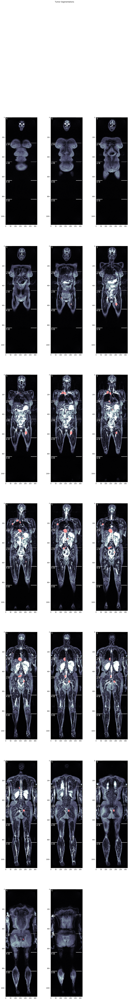

In [17]:
images = [
    './images/001-02.0.dcm', './images/002-06.0.dcm', './images/003-07.0.dcm',
    './images/004-08.0.dcm', './images/005-09.0.dcm', './images/006-10.0.dcm',
    './images/007-11.0.dcm', './images/008-12.0.dcm', './images/009-13.0.dcm',
    './images/010-14.0.dcm', './images/011-15.0.dcm', './images/012-16.0.dcm',
    './images/013-17.0.dcm', './images/014-18.0.dcm', './images/015-19.0.dcm',
    './images/016-20.0.dcm', './images/017-21.0.dcm', './images/018-22.0.dcm',
    './images/019-23.0.dcm', './images/020-24.0.dcm']

n_rows = math.ceil(len(images)*1.0/3)
plt.figure(figsize=(16, 16*n_rows))


for i, img in enumerate(images):
    ax = plt.subplot(n_rows, 3, i+1)
    ds = pydicom.dcmread(img)
    ax.imshow(ds.pixel_array, cmap=plt.cm.bone, vmin=0, vmax=255)
    
    contours = contour_data['dicoms'][i]['contours']
    for contour in contours:
        if len(contour['coords']) > 2:
            poly = Polygon(contour['coords'])
            x,y = poly.exterior.xy
            ax.plot(x, y, color='#ff0000', alpha=0.4,
                linewidth=1, solid_capstyle='round', zorder=2)


plt.suptitle('Tumor Segmentations')
plt.show()

## Export augmented dicoms to png files on disk

<Figure size 144x1152 with 0 Axes>

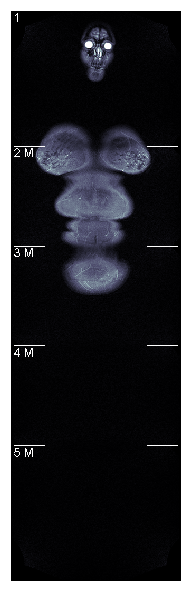

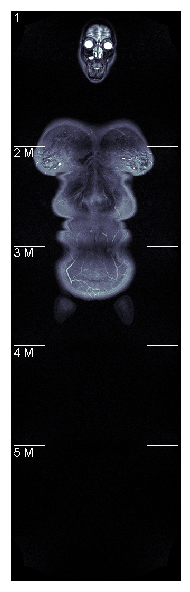

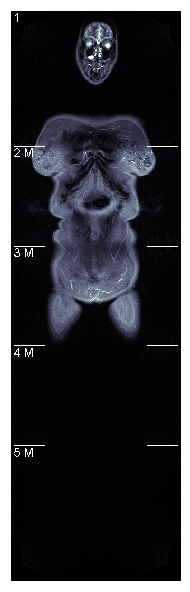

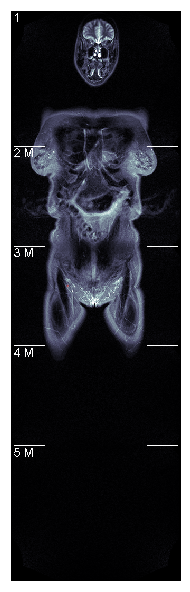

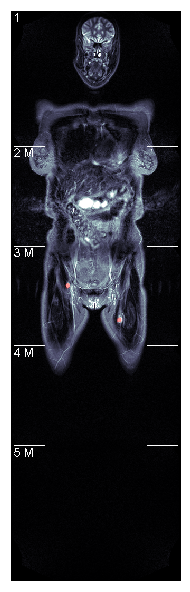

...

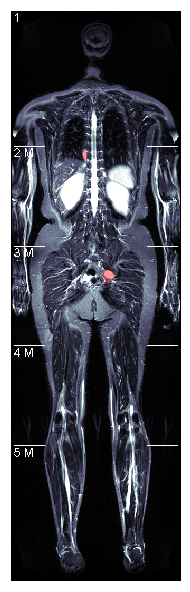

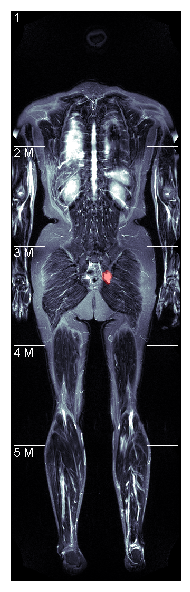

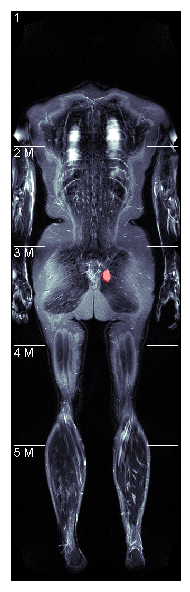

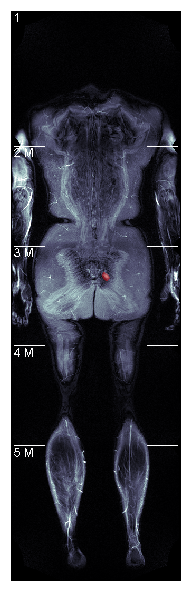

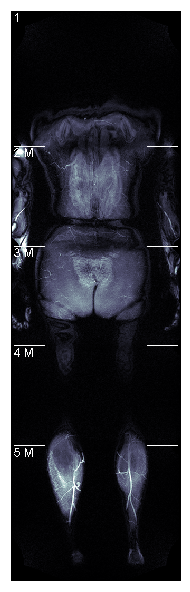

In [19]:
images = [
    './images/001-02.0.dcm', './images/002-06.0.dcm', './images/003-07.0.dcm',
    './images/004-08.0.dcm', './images/005-09.0.dcm', './images/006-10.0.dcm',
    './images/007-11.0.dcm', './images/008-12.0.dcm', './images/009-13.0.dcm',
    './images/010-14.0.dcm', './images/011-15.0.dcm', './images/012-16.0.dcm',
    './images/013-17.0.dcm', './images/014-18.0.dcm', './images/015-19.0.dcm',
    './images/016-20.0.dcm', './images/017-21.0.dcm', './images/018-22.0.dcm',
    './images/019-23.0.dcm', './images/020-24.0.dcm']

plt.figure(figsize=(2, 16))

for i, img in enumerate(images):
    fig,ax = plt.subplots(1)
    fig.set_size_inches(18.5, 10.5)
    ds = pydicom.dcmread(img)
    ax.imshow(ds.pixel_array, cmap=plt.cm.bone, vmin=0, vmax=255)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    
    contours = contour_data['dicoms'][i]['contours']
    for contour in contours:
        if len(contour['coords']) > 2:
            poly = Polygon(contour['coords'])
            x,y = poly.exterior.xy
            ax.plot(x, y, color='#ff0000', alpha=0.4,
                linewidth=1, solid_capstyle='round', zorder=2)
    plt.axis('off')

    plt.savefig('./frames/%02d.png' % (i), transparent=False, bbox_inches='tight', pad_inches=0)
    plt.show()

## Convert png files to mp4

In terminal, run `ffmpeg -framerate 2/1 -i ./frames/%02d.png -c:v libx264 -r 30 demo-video.mp4`